In [1]:
from typing import Dict, Tuple
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import models, transforms
from torchvision.utils import save_image, make_grid
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
from IPython.display import HTML
from diffusion_utilities import *

In [2]:
# MNIST
from torchvision import datasets, transforms
dataset = datasets.FashionMNIST('~/.pytorch/FashionMNIST_data/', train=True, download=True, transform=transform)

# Setting Things Up

In [3]:
class ContextUnet(nn.Module):
    def __init__(self, in_channels, n_feat=256, n_cfeat=10, height=28):  # cfeat - context features
        super(ContextUnet, self).__init__()

        # number of input channels, number of intermediate feature maps and number of classes
        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_cfeat = n_cfeat
        self.h = height  #assume h == w. must be divisible by 4, so 28,24,20,16...

        # Initialize the initial convolutional layer
        self.init_conv = ResidualConvBlock(in_channels, n_feat, is_res=True)

        # Initialize the down-sampling path of the U-Net with two levels
        self.down1 = UnetDown(n_feat, n_feat)        # down1 #[10, 256, 8, 8]
        self.down2 = UnetDown(n_feat, 2 * n_feat)    # down2 #[10, 256, 4,  4]
        
         # original: self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())
        self.to_vec = nn.Sequential(nn.AvgPool2d((4)), nn.GELU())

        # Embed the timestep and context labels with a one-layer fully connected neural network
        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_cfeat, 2*n_feat)
        self.contextembed2 = EmbedFC(n_cfeat, 1*n_feat)

        # Initialize the up-sampling path of the U-Net with three levels
        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, self.h//4, self.h//4), # up-sample 
            nn.GroupNorm(8, 2 * n_feat), # normalize                        
            nn.ReLU(),
        )
        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)

        # Initialize the final convolutional layers to map to the same number of channels as the input image
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1), # reduce number of feature maps   #in_channels, out_channels, kernel_size, stride=1, padding=0
            nn.GroupNorm(8, n_feat), # normalize
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1), # map to same number of channels as input
        )

    def forward(self, x, t, c=None):
        """
        x : (batch, n_feat, h, w) : input image
        t : (batch, n_cfeat)      : time step
        c : (batch, n_classes)    : context label
        """
        # x is the input image, c is the context label, t is the timestep, context_mask says which samples to block the context on

        # pass the input image through the initial convolutional layer
        x = self.init_conv(x)
        # pass the result through the down-sampling path
        down1 = self.down1(x)       #[10, 256, 8, 8]
        down2 = self.down2(down1)   #[10, 256, 4, 4]
        
        # convert the feature maps to a vector and apply an activation
        hiddenvec = self.to_vec(down2)
        
        # mask out context if context_mask == 1
        if c is None:
            c = torch.zeros(x.shape[0], self.n_cfeat).to(x)
            
        # embed context and timestep
        cemb1 = self.contextembed1(c).view(-1, self.n_feat * 2, 1, 1)     # (batch, 2*n_feat, 1,1)
        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        cemb2 = self.contextembed2(c).view(-1, self.n_feat, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)
        #print(f"uunet forward: cemb1 {cemb1.shape}. temb1 {temb1.shape}, cemb2 {cemb2.shape}. temb2 {temb2.shape}")


        up1 = self.up0(hiddenvec)
        up2 = self.up1(cemb1*up1 + temb1, down2)  # add and multiply embeddings
        up3 = self.up2(cemb2*up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out


In [4]:
# hyperparameters

# diffusion hyperparameters
timesteps = 1000
beta1 = 1e-4
beta2 = 0.02

# network hyperparameters
device = torch.device("cuda:0" if torch.cuda.is_available() else torch.device('cpu'))
device = torch.device("mps" if torch.backends.mps.is_available() else torch.device('cpu'))
n_feat = 64 # 64 hidden dimension feature
n_cfeat = 10 # context vector is of size 10
height = 28 # 16x16 image
save_dir = './collapse/'
chan = 1

# training hyperparameters
batch_size = 50
n_epoch = 20
lrate=1e-5

In [5]:
# construct DDPM noise schedule
b_t = (beta2 - beta1) * torch.linspace(0, 1, timesteps + 1, device=device) + beta1
a_t = 1 - b_t
ab_t = torch.cumsum(a_t.log(), dim=0).exp()    
ab_t[0] = 1

In [6]:
# construct model
nn_model = ContextUnet(in_channels=chan, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

In [7]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load("collapse/collapse_91_070.pth", map_location=device))
print("Loaded in Model without context")

Loaded in Model without context


# Choose dataset

In [8]:
def first_n (N, mask):
    n = 0
    for i in range(len(mask)):
        if mask[i]:
            n += 1
        if n == N:
            for j in range(i+1, len(mask)):
                mask[j] = False
            break
    return mask

In [9]:
mask_1 = dataset.targets == 2
first_n(500, mask_1)
mask_2 = dataset.targets == 7
first_n(500, mask_2)
mask = mask_1 | mask_2
dataset = torch.utils.data.Subset(dataset, torch.where(mask)[0])


In [10]:
len(dataset)

1000

# Training

In [12]:
lrate = 1e-3

In [53]:
nn_model = ContextUnet(in_channels=chan, n_feat=n_feat, n_cfeat=n_cfeat, height=height).to(device)

In [54]:
dataloader = DataLoader(dataset, batch_size=100, shuffle=True, num_workers=1)
optim = torch.optim.Adam(nn_model.parameters(), lr=lrate)
#optim = torch.optim.SGD(nn_model.parameters(), lr=lrate)

In [55]:
# helper function: perturbs an image to a specified noise level 
def perturb_input(x, t, noise):
    return ab_t.sqrt()[t, None, None, None] * x + (1 - ab_t[t, None, None, None]) * noise

In [56]:
n_epoch = 100

In [59]:
# training without context code
l_min = 1
# set into train mode
nn_model.train()

for ep in range(n_epoch):
    print(f'epoch {ep+1}')
    
    # linearly decay learning rate
    optim.param_groups[0]['lr'] = lrate*(1-ep/n_epoch)
    
    pbar = tqdm(dataloader, mininterval=2 )
    for x, _ in pbar:   # x: images
        optim.zero_grad()
        x = x.to(device)
        
        # perturb data
        noise = torch.randn_like(x)
        t = torch.randint(1, timesteps + 1, (x.shape[0],)).to(device) 
        x_pert = perturb_input(x, t, noise)
        
        # use network to recover noise
        pred_noise = nn_model(x_pert, t / timesteps)
        
        # loss is mean squared error between the predicted and true noise
        loss = F.mse_loss(pred_noise, noise)
        loss.backward()
        
        optim.step()
    print("Loss = ", loss.item())
    # save model periodically
    if ep%10==0 or ep == int(n_epoch-1) or l_min>loss.item():
        if not os.path.exists(save_dir):
            os.mkdir(save_dir)
        if l_min>loss.item():
            l_min = loss.item()
        torch.save(nn_model.state_dict(), save_dir + f"collapse_{ep+1}.pth")
        print('saved model at ' + save_dir + f"collapse_{ep+1}.pth")
        

epoch 1


100%|██████████| 10/10 [00:08<00:00,  1.20it/s]


Loss =  0.10992060601711273
saved model at ./collapse/collapse_1.pth
epoch 2


100%|██████████| 10/10 [00:07<00:00,  1.27it/s]


Loss =  0.10274302214384079
saved model at ./collapse/collapse_2.pth
epoch 3


100%|██████████| 10/10 [00:06<00:00,  1.49it/s]


Loss =  0.053169138729572296
saved model at ./collapse/collapse_3.pth
epoch 4


100%|██████████| 10/10 [00:05<00:00,  1.72it/s]


Loss =  0.08041652292013168
epoch 5


100%|██████████| 10/10 [00:06<00:00,  1.66it/s]


Loss =  0.07366026192903519
epoch 6


100%|██████████| 10/10 [00:05<00:00,  1.75it/s]


Loss =  0.053196683526039124
epoch 7


100%|██████████| 10/10 [00:05<00:00,  1.67it/s]


Loss =  0.0966363251209259
epoch 8


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Loss =  0.10446415096521378
epoch 9


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Loss =  0.09818313270807266
epoch 10


100%|██████████| 10/10 [00:05<00:00,  1.76it/s]


Loss =  0.12821151316165924
epoch 11


100%|██████████| 10/10 [00:05<00:00,  1.78it/s]


Loss =  0.09495458751916885
saved model at ./collapse/collapse_11.pth
epoch 12


100%|██████████| 10/10 [00:05<00:00,  1.71it/s]


Loss =  0.12924019992351532
epoch 13


100%|██████████| 10/10 [00:05<00:00,  1.67it/s]


Loss =  0.112445168197155
epoch 14


100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


Loss =  0.08367673307657242
epoch 15


100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Loss =  0.11733637750148773
epoch 16


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Loss =  0.0770883709192276
epoch 17


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Loss =  0.13052059710025787
epoch 18


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Loss =  0.07913076132535934
epoch 19


100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


Loss =  0.06261961907148361
epoch 20


100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


Loss =  0.08824534714221954
epoch 21


100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


Loss =  0.0714278519153595
saved model at ./collapse/collapse_21.pth
epoch 22


100%|██████████| 10/10 [00:06<00:00,  1.65it/s]


Loss =  0.10424895584583282
epoch 23


100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


Loss =  0.06264663487672806
epoch 24


100%|██████████| 10/10 [00:05<00:00,  1.75it/s]


Loss =  0.06942274421453476
epoch 25


100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


Loss =  0.08056774735450745
epoch 26


100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


Loss =  0.08597862720489502
epoch 27


100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


Loss =  0.10027074813842773
epoch 28


100%|██████████| 10/10 [00:05<00:00,  1.77it/s]


Loss =  0.10399633646011353
epoch 29


100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


Loss =  0.06778343766927719
epoch 30


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Loss =  0.10276618599891663
epoch 31


100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Loss =  0.07929471135139465
saved model at ./collapse/collapse_31.pth
epoch 32


100%|██████████| 10/10 [00:05<00:00,  1.74it/s]


Loss =  0.07582492381334305
epoch 33


100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Loss =  0.12544496357440948
epoch 34


100%|██████████| 10/10 [00:05<00:00,  1.79it/s]


Loss =  0.09638550132513046
epoch 35


100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Loss =  0.07289916276931763
epoch 36


100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


Loss =  0.06258976459503174
epoch 37


100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


Loss =  0.1096329540014267
epoch 38


100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Loss =  0.05801129341125488
epoch 39


100%|██████████| 10/10 [00:05<00:00,  1.69it/s]


Loss =  0.07645288854837418
epoch 40


100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


Loss =  0.11296489089727402
epoch 41


100%|██████████| 10/10 [00:05<00:00,  1.67it/s]


Loss =  0.09927401691675186
saved model at ./collapse/collapse_41.pth
epoch 42


100%|██████████| 10/10 [00:05<00:00,  1.75it/s]


Loss =  0.08330924063920975
epoch 43


100%|██████████| 10/10 [00:05<00:00,  1.73it/s]


Loss =  0.07268082350492477
epoch 44


100%|██████████| 10/10 [00:06<00:00,  1.63it/s]


Loss =  0.08749398589134216
epoch 45


100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


Loss =  0.07753532379865646
epoch 46


100%|██████████| 10/10 [00:05<00:00,  1.81it/s]


Loss =  0.06776148080825806
epoch 47


100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Loss =  0.07525388896465302
epoch 48


100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Loss =  0.0836157351732254
epoch 49


100%|██████████| 10/10 [00:05<00:00,  1.80it/s]


Loss =  0.07553474605083466
epoch 50


100%|██████████| 10/10 [00:05<00:00,  1.71it/s]


Loss =  0.0890643373131752
epoch 51


100%|██████████| 10/10 [00:06<00:00,  1.55it/s]


Loss =  0.11408037692308426
saved model at ./collapse/collapse_51.pth
epoch 52


100%|██████████| 10/10 [00:06<00:00,  1.66it/s]


Loss =  0.0857706144452095
epoch 53


100%|██████████| 10/10 [00:06<00:00,  1.61it/s]


Loss =  0.06348231434822083
epoch 54


100%|██████████| 10/10 [00:06<00:00,  1.63it/s]


Loss =  0.0963512659072876
epoch 55


100%|██████████| 10/10 [00:07<00:00,  1.31it/s]


Loss =  0.07781706750392914
epoch 56


100%|██████████| 10/10 [00:08<00:00,  1.12it/s]


Loss =  0.051782816648483276
saved model at ./collapse/collapse_56.pth
epoch 57


100%|██████████| 10/10 [00:08<00:00,  1.13it/s]


Loss =  0.09907819330692291
epoch 58


100%|██████████| 10/10 [00:09<00:00,  1.08it/s]


Loss =  0.06395553052425385
epoch 59


100%|██████████| 10/10 [00:08<00:00,  1.19it/s]


Loss =  0.0590108260512352
epoch 60


100%|██████████| 10/10 [00:06<00:00,  1.47it/s]


Loss =  0.08919087052345276
epoch 61


100%|██████████| 10/10 [00:06<00:00,  1.46it/s]


Loss =  0.06930229067802429
saved model at ./collapse/collapse_61.pth
epoch 62


100%|██████████| 10/10 [00:06<00:00,  1.53it/s]


Loss =  0.09595699608325958
epoch 63


100%|██████████| 10/10 [00:06<00:00,  1.49it/s]


Loss =  0.08565916121006012
epoch 64


100%|██████████| 10/10 [00:06<00:00,  1.43it/s]


Loss =  0.08470285683870316
epoch 65


100%|██████████| 10/10 [00:06<00:00,  1.57it/s]


Loss =  0.08479679375886917
epoch 66


100%|██████████| 10/10 [00:06<00:00,  1.53it/s]


Loss =  0.08439688384532928
epoch 67


100%|██████████| 10/10 [00:08<00:00,  1.21it/s]


Loss =  0.06822575628757477
epoch 68


100%|██████████| 10/10 [00:08<00:00,  1.12it/s]


Loss =  0.07795581966638565
epoch 69


100%|██████████| 10/10 [00:08<00:00,  1.21it/s]


Loss =  0.07073532044887543
epoch 70


100%|██████████| 10/10 [00:07<00:00,  1.30it/s]


Loss =  0.07015465199947357
epoch 71


100%|██████████| 10/10 [00:07<00:00,  1.31it/s]


Loss =  0.06790485233068466
saved model at ./collapse/collapse_71.pth
epoch 72


100%|██████████| 10/10 [00:06<00:00,  1.48it/s]


Loss =  0.09965327382087708
epoch 73


100%|██████████| 10/10 [00:06<00:00,  1.57it/s]


Loss =  0.08374733477830887
epoch 74


100%|██████████| 10/10 [00:06<00:00,  1.65it/s]


Loss =  0.07619227468967438
epoch 75


100%|██████████| 10/10 [00:06<00:00,  1.50it/s]


Loss =  0.078626848757267
epoch 76


100%|██████████| 10/10 [00:07<00:00,  1.35it/s]


Loss =  0.08084794133901596
epoch 77


100%|██████████| 10/10 [00:08<00:00,  1.17it/s]


Loss =  0.08131653815507889
epoch 78


100%|██████████| 10/10 [00:08<00:00,  1.13it/s]


Loss =  0.12345212697982788
epoch 79


100%|██████████| 10/10 [00:09<00:00,  1.11it/s]


Loss =  0.11577898263931274
epoch 80


100%|██████████| 10/10 [00:10<00:00,  1.04s/it]


Loss =  0.0798649713397026
epoch 81


100%|██████████| 10/10 [00:07<00:00,  1.25it/s]


Loss =  0.07943091541528702
saved model at ./collapse/collapse_81.pth
epoch 82


100%|██████████| 10/10 [00:06<00:00,  1.48it/s]


Loss =  0.05183425173163414
epoch 83


100%|██████████| 10/10 [00:06<00:00,  1.57it/s]


Loss =  0.09576137363910675
epoch 84


100%|██████████| 10/10 [00:05<00:00,  1.71it/s]


Loss =  0.08313219994306564
epoch 85


100%|██████████| 10/10 [00:06<00:00,  1.48it/s]


Loss =  0.08592489361763
epoch 86


100%|██████████| 10/10 [00:07<00:00,  1.41it/s]


Loss =  0.09137047082185745
epoch 87


100%|██████████| 10/10 [00:09<00:00,  1.11it/s]


Loss =  0.07981477677822113
epoch 88


100%|██████████| 10/10 [00:09<00:00,  1.04it/s]


Loss =  0.08456814289093018
epoch 89


100%|██████████| 10/10 [00:11<00:00,  1.18s/it]


Loss =  0.09441076964139938
epoch 90


100%|██████████| 10/10 [00:09<00:00,  1.11it/s]


Loss =  0.08402666449546814
epoch 91


100%|██████████| 10/10 [00:07<00:00,  1.42it/s]


Loss =  0.06977477669715881
saved model at ./collapse/collapse_91.pth
epoch 92


100%|██████████| 10/10 [00:06<00:00,  1.48it/s]


Loss =  0.06164296716451645
epoch 93


100%|██████████| 10/10 [00:07<00:00,  1.34it/s]


Loss =  0.06488209962844849
epoch 94


100%|██████████| 10/10 [00:06<00:00,  1.47it/s]


Loss =  0.0916895791888237
epoch 95


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]


Loss =  0.08764459937810898
epoch 96


100%|██████████| 10/10 [00:06<00:00,  1.53it/s]


Loss =  0.10476291179656982
epoch 97


100%|██████████| 10/10 [00:05<00:00,  1.71it/s]


Loss =  0.08654720336198807
epoch 98


100%|██████████| 10/10 [00:06<00:00,  1.65it/s]


Loss =  0.0848960280418396
epoch 99


100%|██████████| 10/10 [00:07<00:00,  1.29it/s]


Loss =  0.059067219495773315
epoch 100


100%|██████████| 10/10 [00:08<00:00,  1.22it/s]

Loss =  0.09116555005311966
saved model at ./collapse/collapse_100.pth


# Model

In [11]:
# load in model weights and set to eval mode
nn_model.load_state_dict(torch.load("collapse/collapse_91_070.pth", map_location=device))
#nn_model.load_state_dict(torch.load("02_Adam_e-3/MNIST_20.pth", map_location=device))
nn_model.eval() 
print("Loaded in Model without context")

Loaded in Model without context


# Sampling

In [12]:
# helper function; removes the predicted noise (but adds some noise back in to avoid collapse)
def denoise_add_noise(x, t, pred_noise, z=None):
    if z is None:
        z = torch.randn_like(x)
    noise = b_t.sqrt()[t] * z
    mean = (x - pred_noise * ((1 - a_t[t]) / (1 - ab_t[t]).sqrt())) / a_t[t].sqrt()
    return mean + noise

In [13]:
# sample using standard algorithm
@torch.no_grad()
def sample_ddpm(n_sample, save_rate=20):
    # x_T ~ N(0, 1), sample initial noise
    samples = torch.randn(n_sample, chan, height, height).to(device)  

    # array to keep track of generated steps for plotting
    intermediate = [] 
    for i in range(timesteps, 0, -1):
        print(f'sampling timestep {i:3d}', end='\r')

        # reshape time tensor
        t = torch.tensor([i / timesteps])[:, None, None, None].to(device)

        # sample some random noise to inject back in. For i = 1, don't add back in noise
        z = torch.randn_like(samples) if i > 1 else 0

        eps = nn_model(samples, t)    # predict noise e_(x_t,t)
        samples = denoise_add_noise(samples, i, eps, z)
        if i % save_rate ==0 or i==timesteps or i<8:
            intermediate.append(samples.detach().cpu().numpy())

    intermediate = np.stack(intermediate)
    return samples, intermediate

In [14]:
n_samples = 16

In [64]:
# visualize samples
plt.clf()
samples, intermediate_ddpm = sample_ddpm(n_samples)
animation_ddpm = plot_sample(intermediate_ddpm,n_samples,2,save_dir, "ani_run", None, save=False)
HTML(animation_ddpm.to_jshtml())

<Figure size 640x480 with 0 Axes>

# Collapse

In [15]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 4 * 4, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 2)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net = Net()

In [16]:
net = Net()
net.load_state_dict(torch.load("./reco/fashion_reco.pth"))

<All keys matched successfully>

In [14]:
save_rate = 20

In [15]:
def closest(sam):
    cs = torch.zeros(len(sam))
    sam = sam.view(sam.size(0),-1)
    sam = sam.cpu()
    for i in range(len(dataset)):
        cs = torch.vstack((cs,torch.cosine_similarity(sam, dataset[i][0].view(-1), dim=1)))
    cs = cs[1:]
    #cs is matrix with scores on columns
    return torch.Tensor([torch.argmax(cs[:,j]) for j in range(len(sam))]) #list of closest datapoint to each sample    
    

In [16]:
@torch.no_grad()
def collapse(timesteps):
    fi=dict()
    t_C = []
    for x in range(0,timesteps+1,20):
        fi[x]=0
    
    for o in range (4):
        samples, intermediate = sample_ddpm(25)
        sample_closest = closest(samples)
        t_c = torch.zeros(25, requires_grad= False)
        index = torch.zeros(25, requires_grad= False)

        for step in range(timesteps,-1,-20):
            t_c = torch.zeros(25, requires_grad= False)
            clones = torch.Tensor(intermediate [int(timesteps/save_rate) - int(step/save_rate)]).to(device)
            if step % 100 == 0:
                print(step, "-->", end=" ")

            for i in range(step, 0, -1):
                clones = clones.to(device)
                # reshape time tensor
                t = torch.tensor([i / timesteps])[:, None, None, None].to(device)
                # sample some random noise to inject back in. For i = 1, don't add back in noise
                z = torch.randn_like(clones) if i > 1 else 0
                eps = nn_model(clones, t)    # predict noise e_(x_t,t)
                clones = denoise_add_noise(clones, i, eps, z)
                if step in range(500,701):
                    close = closest(clones)
                    for j in range(25):
                        if close[j] != index[j]:
                            index[j] = close[j]
                            t_c[j] = i
            if step in range (500, 701):
                t_C.append(t_c)
            # Now look at the resulting classes
            clone_closest = closest(clones)
            clones = clones.to(device)
            
        
            fi[step] += int(sum(clone_closest == sample_closest)) 
        print("\n")
        #t_C += torch.sum(t_c)/100

    for x in fi:
        fi[x] /= 100

    return fi, t_C




In [18]:
a, t_C = collapse(timesteps)

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 

1000 --> timestep   10900 --> 800 --> 700 --> 600 --> 500 --> 400 --> 300 --> 200 --> 100 --> 0 --> 



In [21]:
import json

# Save dictionary to a JSON file
with open('collapse_2.json', 'w') as json_file:
    json.dump(a, json_file)


In [205]:
import json
# Load dictionary from the JSON file
with open('collapseeee.json', 'r') as json_file:
    b = json.load(json_file)

a = dict()
for x in b:
    a[int(x)] = b[x]

print(a)

{0: 0.98, 20: 0.93, 40: 0.89, 60: 0.9, 80: 0.85, 100: 0.81, 120: 0.82, 140: 0.82, 160: 0.66, 180: 0.68, 200: 0.66, 220: 0.59, 240: 0.48, 260: 0.51, 280: 0.42, 300: 0.38, 320: 0.41, 340: 0.36, 360: 0.31, 380: 0.33, 400: 0.28, 420: 0.25, 440: 0.15, 460: 0.16, 480: 0.14, 500: 0.13, 520: 0.08, 540: 0.12, 560: 0.08, 580: 0.08, 600: 0.07, 620: 0.11, 640: 0.05, 660: 0.07, 680: 0.04, 700: 0.03, 720: 0.05, 740: 0.05, 760: 0.01, 780: 0.03, 800: 0.01, 820: 0.03, 840: 0.03, 860: 0.02, 880: 0.02, 900: 0.03, 920: 0.0, 940: 0.03, 960: 0.05, 980: 0.0, 1000: 0.03}


In [19]:
N = 1

#Prendine uno ogni N
mask = []
for i in range(len(a)):
    if i%N == 0:
        mask.append(True)
    else:
        mask.append(False)


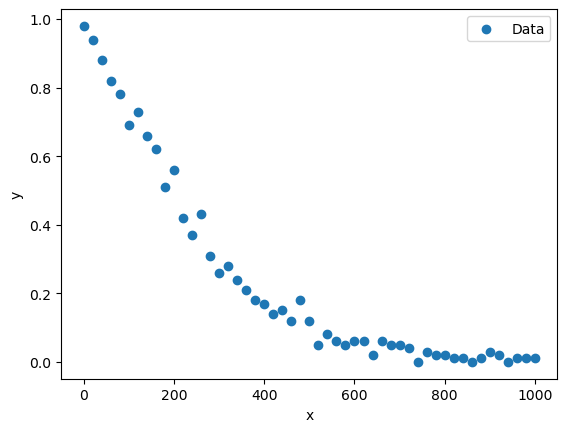

In [20]:
import numpy as np
import matplotlib.pyplot as plt
# Generate example data
new = np.array(list(a.keys()))[mask]
np.random.seed(0)
x_data = np.linspace(0, 1000, len(new))
y_data = np.array([a[x] for x in new]) 

# Plot the original data
plt.scatter(x_data, y_data, label='Data')


plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()


In [22]:
step = list(range(1,1001))
beta = dict()
for t in step:
    beta[t] = round(t * 0.0199 / 999 + (0.02 - 0.0199 / 999 * 1000), 15) # beta = at + b
alpha = dict()
alpha[1] = 1 - beta[1]
for t in step[1:]:
    alpha[t] = alpha[t-1] * (1 - beta[t])

import math
T = dict()
for t in step:
    T[t] = -1/2 * math.log(alpha[t])
T[0] = 0

In [23]:
times = []
for x in t_C:
    for y in x:
        try:
            times.append(T[int(y)])
        except:
            print(y)

In [24]:
np.mean(times)

0.17263673425161286

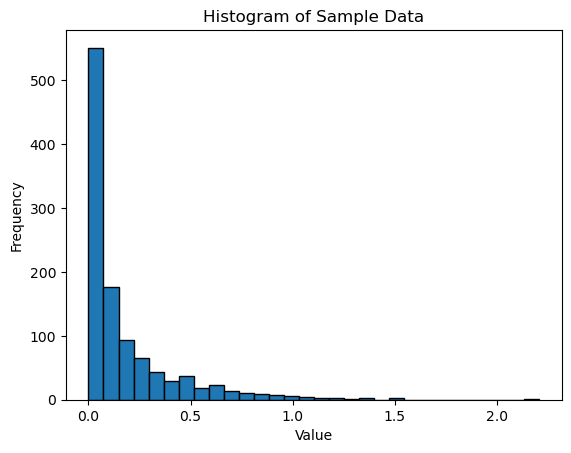

In [25]:
plt.hist(times, bins=30, edgecolor='black')  # 30 bins, with black edges around the bars

# Add labels and title
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of Sample Data')

# Show the plot
plt.show()